# Introduction to Computer Vision

In this workshop we are going to work with different Python libraries with image manipulation support:

* Numpy  
* Matplotlib
* Pillow (PIL)
* OpenCV
* scikit-image

## 0. Do you know Lena?

It's one of the most famous and used images in the beginners of computer vision.    
Provably you have seen her before, but do you know her story?

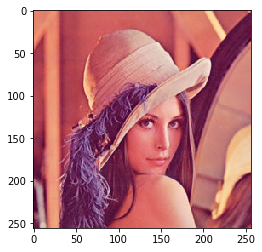

In [5]:
import matplotlib.pyplot as plt

lena = plt.imread('Images/lena.jpg')
plt.imshow(lena)

It was so famous that even scipy had this picture as a default image example to use with this library.   
Hopfully, they decide to take it off amb bring us this nice racoon:

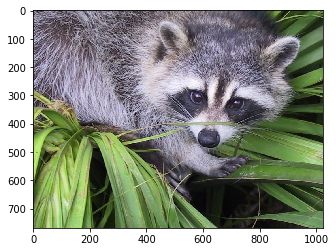

In [3]:
import scipy.misc

face = scipy.misc.face()
plt.imshow(face)

## 1. How an image looks like? What it's made of?

Everybody have seen images but how are they internally and how can be modified or how can we obtain information from them? This is a question that we are trying to solve during this workshop.

In [27]:
import matplotlib.pyplot as plt

image = plt.imread('Images/camera_BW.jpg')

Images are composed by matrixs of values from 0 to 255 (8 bits coded):

In [28]:
image

array([[ 23,  23,  23, ..., 104, 104, 104],
       [ 23,  23,  23, ..., 104, 104, 104],
       [ 23,  23,  23, ..., 104, 104, 104],
       ...,
       [102, 103, 104, ...,  81,  82,  82],
       [103, 104, 105, ...,  79,  80,  80],
       [103, 104, 105, ...,  79,  80,  80]], dtype=uint8)

In [29]:
image.shape

(426, 640)

In [30]:
image.min(), image.max()

(0, 255)

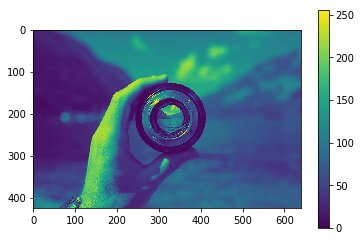

In [31]:
plt.imshow(image)
#plt.imshow(image,cmap='gray')
plt.colorbar()

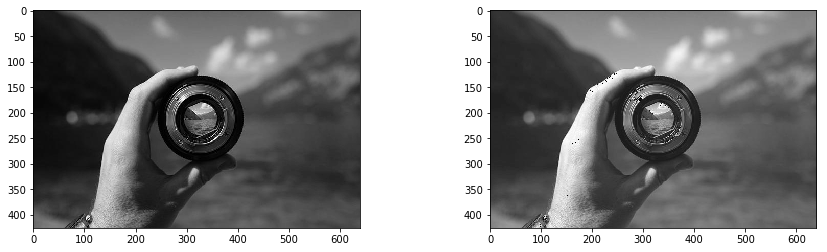

In [32]:
f = plt.figure(figsize=(15,4))

ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)

image_ligth = image + 25

ax1.imshow(image,cmap='gray')
ax2.imshow(image_ligth,cmap='gray')

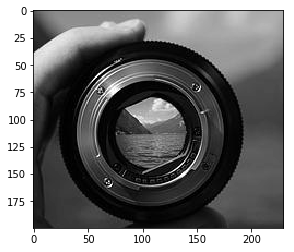

In [33]:
piece = image[100:300,220:450]
plt.imshow(piece,cmap='gray')

In [44]:
image_color = plt.imread('Images/camera_RBG.jpg')

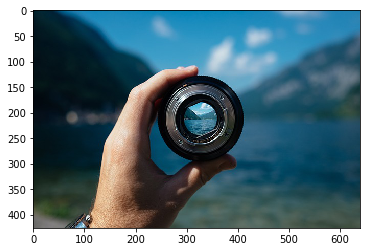

In [45]:
plt.imshow(image_color)

In [46]:
image_color

array([[[  0,  31,  42],
        [  0,  32,  43],
        [  1,  33,  44],
        ...,
        [ 30, 127, 178],
        [ 30, 127, 178],
        [ 30, 127, 178]],

       [[  0,  31,  42],
        [  0,  32,  43],
        [  1,  33,  44],
        ...,
        [ 30, 127, 178],
        [ 30, 127, 178],
        [ 30, 127, 178]],

       [[  0,  31,  42],
        [  0,  32,  43],
        [  0,  32,  43],
        ...,
        [ 31, 128, 179],
        [ 31, 128, 179],
        [ 31, 128, 179]],

       ...,

       [[103, 102, 100],
        [104, 103, 101],
        [104, 103, 101],
        ...,
        [ 73,  87,  74],
        [ 73,  87,  74],
        [ 74,  88,  75]],

       [[104, 103, 101],
        [104, 103, 101],
        [105, 104, 102],
        ...,
        [ 71,  85,  72],
        [ 72,  86,  73],
        [ 73,  87,  74]],

       [[104, 103, 101],
        [104, 103, 101],
        [105, 104, 102],
        ...,
        [ 71,  85,  72],
        [ 71,  85,  72],
        [ 72,  86,  73]]

In [47]:
image_color.shape

(426, 640, 3)

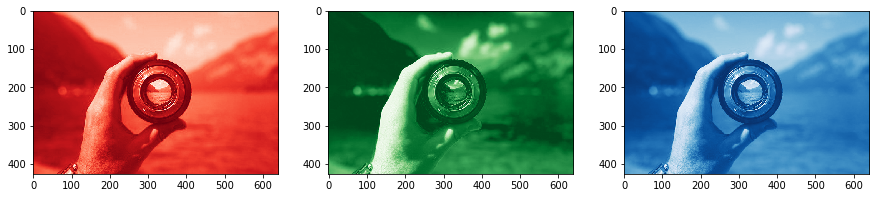

In [48]:
f = plt.figure(figsize=(15,3))

ax1 = f.add_subplot(131)
ax2 = f.add_subplot(132)
ax3 = f.add_subplot(133)

ax1.imshow(image_color[:,:,0],cmap = 'Reds_r')
ax2.imshow(image_color[:,:,1],cmap = 'Greens_r')
ax3.imshow(image_color[:,:,2],cmap = 'Blues_r')

## 2. Especific libraries for images : Pillow (PIL)

In [16]:
from PIL import Image
from IPython.display import display #for display in IPython Notebook

In [17]:
im = Image.open('Images/camera_RBG.jpg')

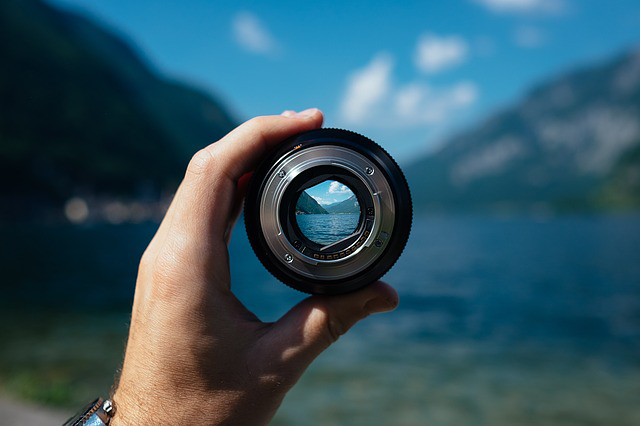

In [18]:
display(im)
#im.show()

We can obtain some information about opened image:

### 2.1 Basic Functions and parameters

In [19]:
im.format, im.size, im.mode, im.layers

('JPEG', (640, 426), 'RGB', 3)

In [20]:
box = (200,100,450,300)
region = im.crop(box)

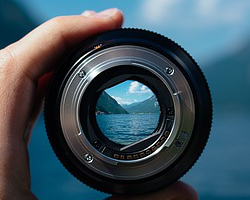

In [21]:
display(region)

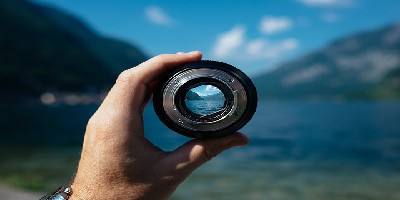

In [22]:
im_resize = im.resize((400, 200))
display(im_resize)

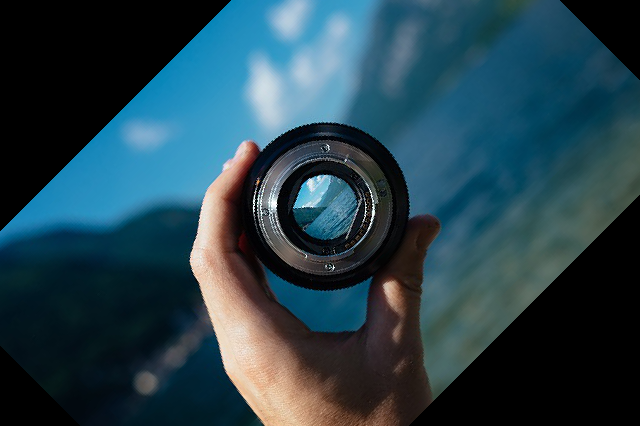

In [23]:
im_rotate_45 = im.rotate(45)
display(im_rotate_45)

 ### 2.2 Image color manipulation:  Filters

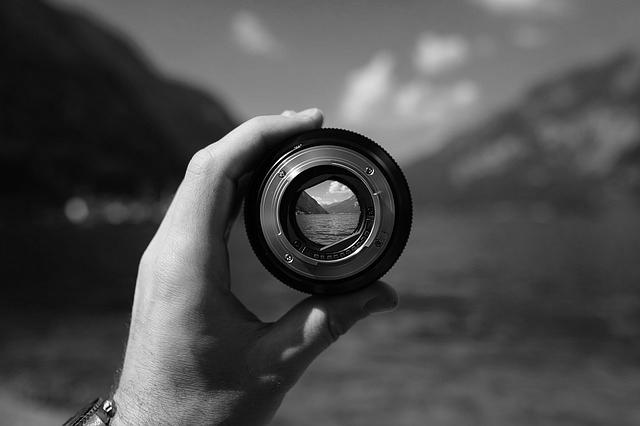

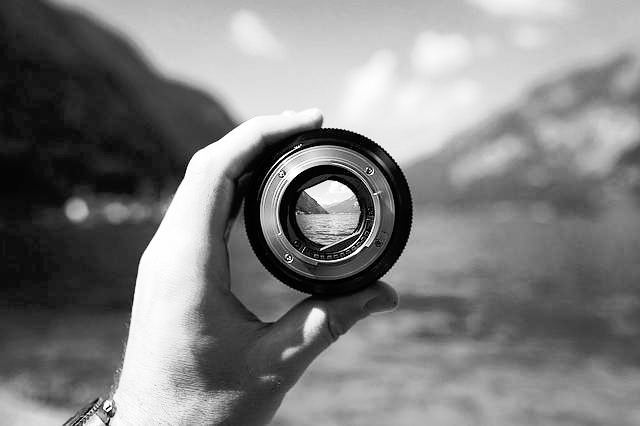

In [24]:
from PIL import ImageOps, Image

im1 = Image.open('Images/camera_BW.jpg')
im2 = ImageOps.equalize(im1)

display(im1)
display(im2)

<Container object of 3 artists>

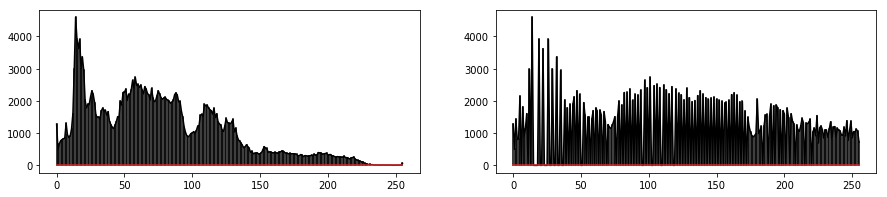

In [25]:
import numpy as np 

f = plt.figure(figsize=(15,3))

ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)

ax1.stem(im1.histogram(),linefmt = 'k-',markerfmt = 'k')
ax2.stem(im2.histogram(), linefmt = 'k-',markerfmt = 'k')

(2048, 1536)
(682, 512)


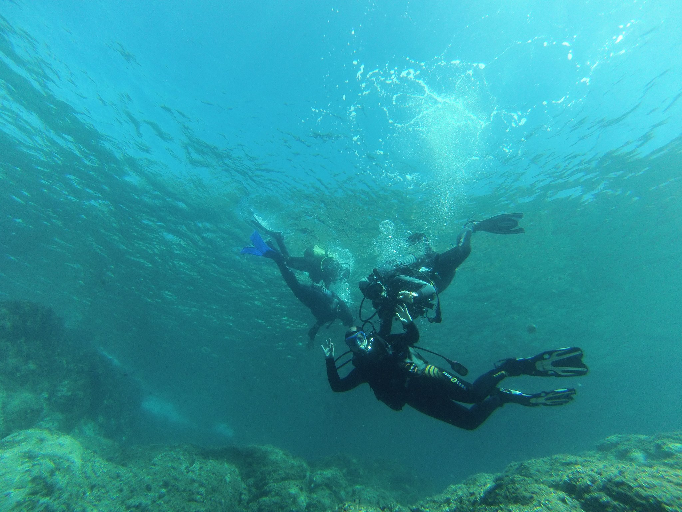

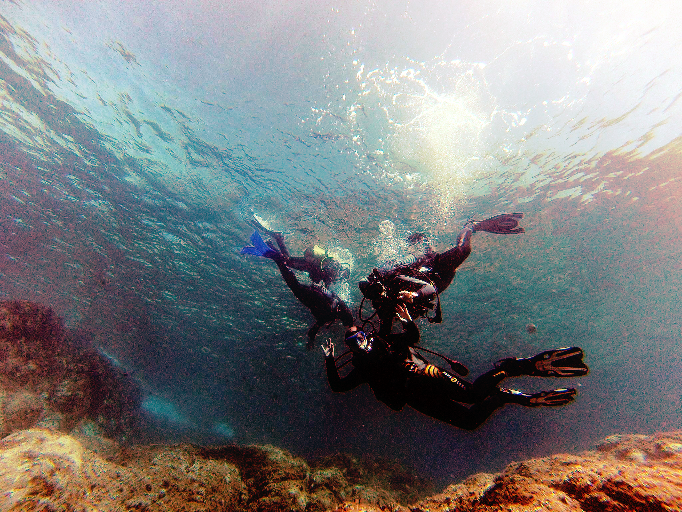

In [70]:
im1 = Image.open('Images/underwater.jpg')

print im1.size
im1_r = im1.resize((im1.width/3,im1.height/3))
print im1_r.size

im2_r = ImageOps.equalize(im1_r)

display(im1_r)
display(im2_r)

![](https://manoa.hawaii.edu/exploringourfluidearth/sites/default/files/Fig9.7-LightPenetration.jpg)

512


<Container object of 3 artists>

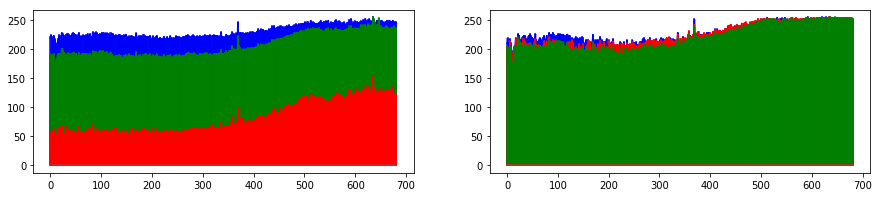

In [87]:
import numpy as np 

f = plt.figure(figsize=(15,3))

ax1 = f.add_subplot(121)
ax2 = f.add_subplot(122)

im1_values = np.array(im1_r) 

print len(im1_values[:,:,0])

ax1.stem(im1_values[:,:,2][0],linefmt = 'b-',markerfmt = 'b')
ax1.stem(im1_values[:,:,1][0],linefmt = 'g-',markerfmt = 'g')
ax1.stem(im1_values[:,:,0][0],linefmt = 'r-',markerfmt = 'r')

im2_values = np.array(im2_r)

ax2.stem(im2_values[:,:,2][0],linefmt = 'b-',markerfmt = 'b')
ax2.stem(im2_values[:,:,0][0],linefmt = 'r-',markerfmt = 'r')
ax2.stem(im2_values[:,:,1][0],linefmt = 'g-',markerfmt = 'g')

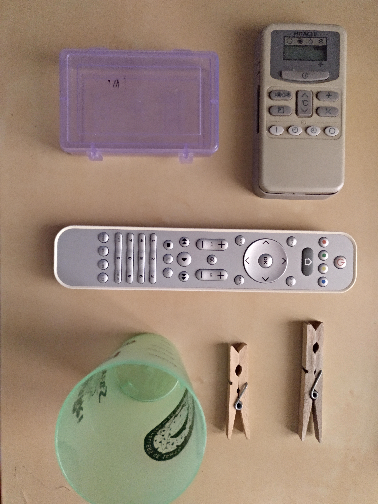

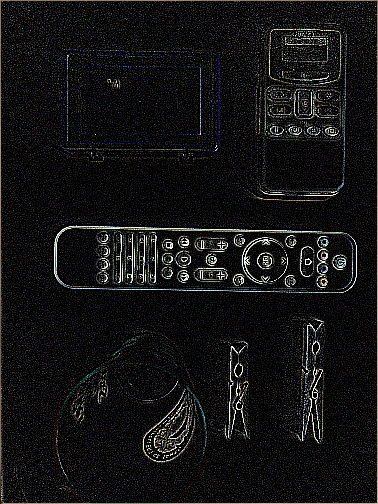

In [94]:
from PIL import Image, ImageFilter

image = Image.open('Images/objects.jpg')
image_r = image.resize((image.width/8,image.height/8))

image_edges = image_r.filter(ImageFilter.FIND_EDGES)
display(image_r)
display(image_edges)

In [96]:
help(ImageFilter)

Help on module PIL.ImageFilter in PIL:

NAME
    PIL.ImageFilter

FILE
    /usr/local/lib/python2.7/dist-packages/PIL/ImageFilter.py

DESCRIPTION
    # The Python Imaging Library.
    # $Id$
    #
    # standard filters
    #
    # History:
    # 1995-11-27 fl   Created
    # 2002-06-08 fl   Added rank and mode filters
    # 2003-09-15 fl   Fixed rank calculation in rank filter; added expand call
    #
    # Copyright (c) 1997-2003 by Secret Labs AB.
    # Copyright (c) 1995-2002 by Fredrik Lundh.
    #
    # See the README file for information on usage and redistribution.
    #

CLASSES
    __builtin__.object
        Filter
            ModeFilter
            MultibandFilter
                BoxBlur
                Color3DLUT
                GaussianBlur
                Kernel
                    BuiltinFilter
                        BLUR
                        CONTOUR
                        DETAIL
                        EDGE_ENHANCE
                        EDGE_ENHANCE_MORE
        

### 2.3 You can design your own filter

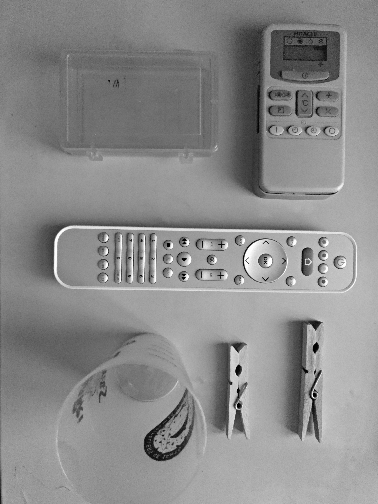

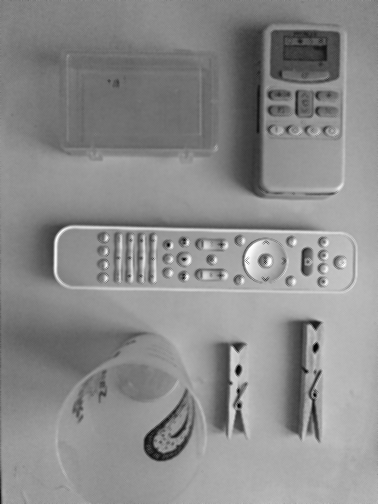

In [104]:
kernel = ImageFilter.Kernel((3, 3), (0, 1, 0, 1, 0, 1, 0, 1, 0))
image_BW = image_r.convert('L')
image_kernel = image_BW.filter(kernel)
display(image_BW)
display(image_kernel)

Now you can try different kernels and effects:https://en.wikipedia.org/wiki/Kernel_(image_processing)

## 3. OpenCV: Computer Vision like a PRO

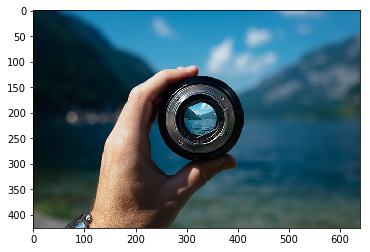

In [110]:
import matplotlib.pyplot as plt
import cv2

image = cv2.imread('Images/camera_RBG.jpg')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

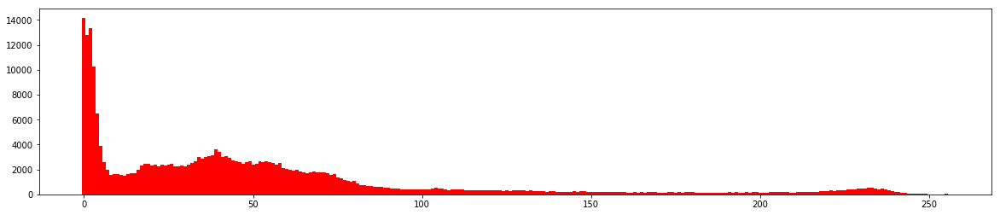

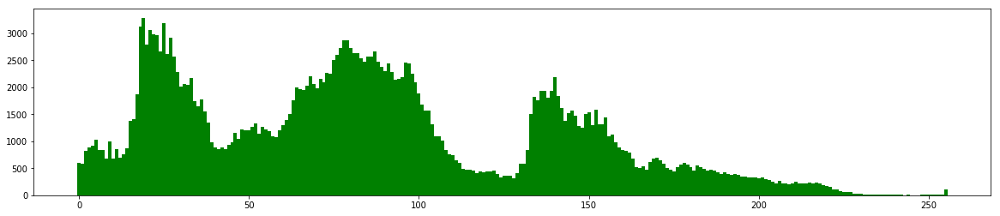

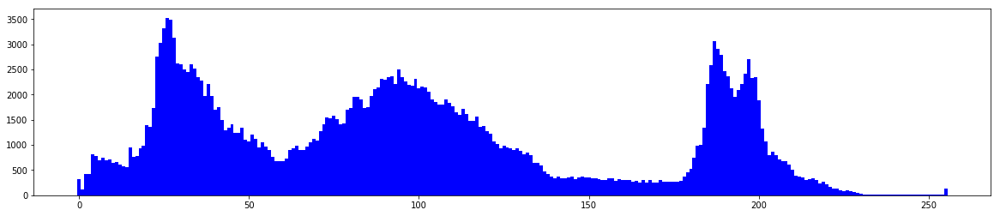

In [4]:
import matplotlib.pyplot as plt
import cv2

img = cv2.imread('Images/camera_RBG.jpg')
image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

colours = ('r','g','b')

for i, c in enumerate(colours):
    plt.figure(figsize=(20, 4))
    histr = cv2.calcHist([image], [i], None, [256], [0, 256])

    if c == 'r': colours = [((i/256, 0, 0)) for i in range(0, 256)]
    if c == 'g': colours = [((0, i/256, 0)) for i in range(0, 256)]
    if c == 'b': colours = [((0, 0, i/256)) for i in range(0, 256)]

    plt.bar(range(0, 256), histr, color=c, width=1)

plt.show()

### 3.1 Masks: Detect objects by color

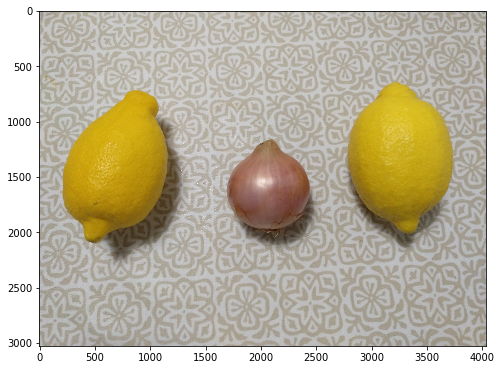

In [3]:
import cv2 
import matplotlib.pyplot as plt

image = cv2.imread('Images/lemon.jpg')
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8,8))
plt.imshow(img)

In [298]:
lower_yellow = np.array([[20, 194, 120]])
upper_yellow = np.array([25, 255, 255])

In [299]:
imgBGR = cv2.GaussianBlur(image, (7, 7), 0)
imgHSV = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2HSV)

<IPython.core.display.Javascript object>


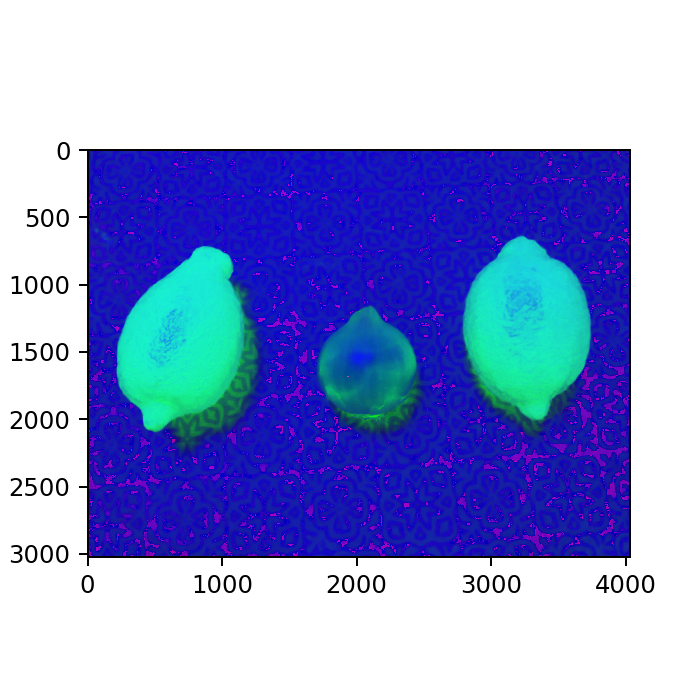

In [300]:
%matplotlib notebook
plt.figure(figsize=(4,4))
plt.imshow(imgHSV)

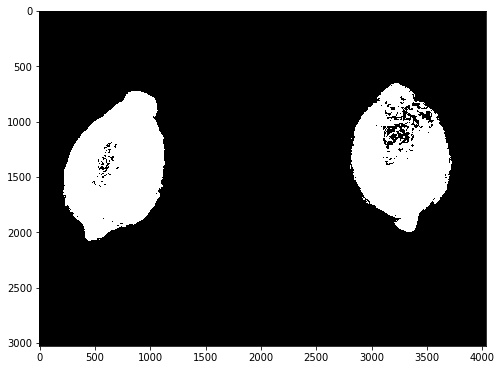

In [301]:
%matplotlib inline

mask = cv2.inRange(imgHSV, lower_yellow, upper_yellow)

plt.figure(figsize=(8,8))
plt.imshow(mask,cmap = 'gray')

In [302]:
cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

In [303]:
len(cnts[1])

34

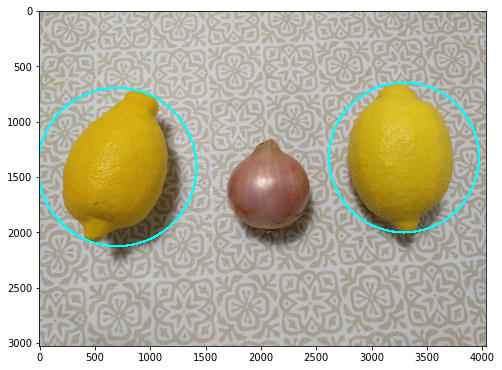

In [304]:
for cnt in cnts[1]:
    ((x, y), radius) = cv2.minEnclosingCircle(cnt)
    
    if radius > 100:
        cv2.circle(img, (int(x), int(y)), int(radius),(0, 255, 255), 20)
    
plt.figure(figsize=(8,8))
plt.imshow(img)

### 3.2 Perspective conversions: Photo Scan example

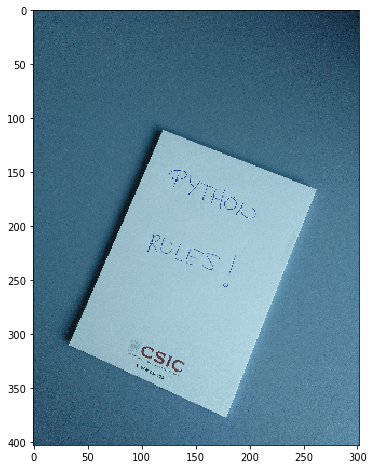

In [4]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

image = cv2.imread('Images/nota.jpg')
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

height, width = image.shape[:2]
im_r = cv2.resize(img,(width/10, height/10), interpolation = cv2.INTER_CUBIC)

plt.figure(figsize=(8,8))
plt.imshow(im_r)

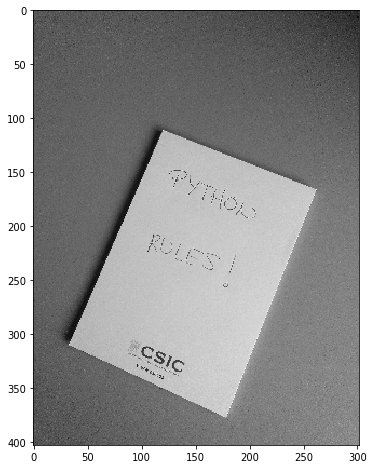

In [5]:
imgray = cv2.cvtColor(im_r,cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(8,8))
plt.imshow(imgray, cmap='gray')

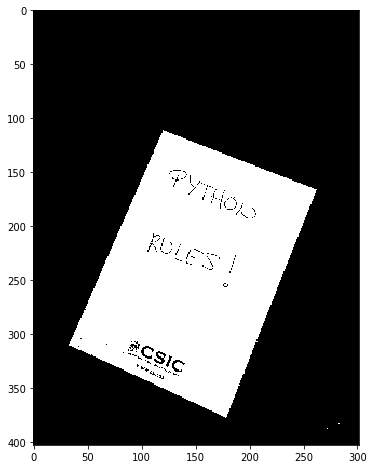

In [6]:
ret,thresh = cv2.threshold(imgray,170,255,0)

plt.figure(figsize=(8,8))
plt.imshow(thresh, cmap='gray')

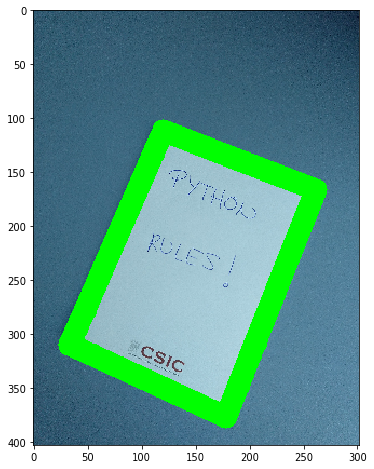

In [7]:
_, contours, _ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key = cv2.contourArea, reverse = True)[:10]

cv2.drawContours(im_r, contours, 0, (0,255,0), 20)

plt.figure(figsize=(8,8))
plt.imshow(im_r, cmap = 'gray')

In [8]:
peri = cv2.arcLength(contours[0], True)
points = cv2.approxPolyDP(contours[0], 0.02 * peri, True)

points

array([[[120, 111]],

       [[ 33, 310]],

       [[178, 377]],

       [[262, 166]]], dtype=int32)

In [11]:
points = points.reshape(4,2)
rect = np.zeros((4,2),dtype = 'float32')
rect[0],rect[1],rect[2],rect[3] = points[0],points[3],points[2],points[1]

rect

array([[120., 111.],
       [262., 166.],
       [178., 377.],
       [ 33., 310.]], dtype=float32)

In [12]:
(tl, tr, br, bl) = rect

widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))

heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))

maxWidth = max(int(widthA), int(widthB))
maxHeight = max(int(heightA), int(heightB))

In [13]:
points_dst = np.array([[0, 0],[maxWidth - 1, 0],[maxWidth - 1, maxHeight - 1],
                [0, maxHeight - 1]], dtype = "float32")

In [16]:
M = cv2.getPerspectiveTransform(rect, points_dst)
scan = cv2.warpPerspective(thresh, M, (maxWidth, maxHeight))

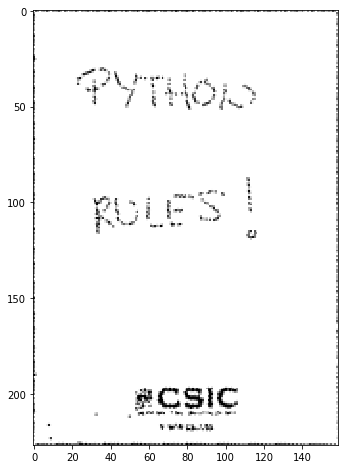

In [17]:
plt.figure(figsize=(8,8))
plt.imshow(scan, cmap = 'gray')

### 4. Machine/Deep Learning: Face Detection examples

In [2]:
import matplotlib.pyplot as plt
from skimage import io, data, exposure
from skimage.feature import hog
import numpy as np

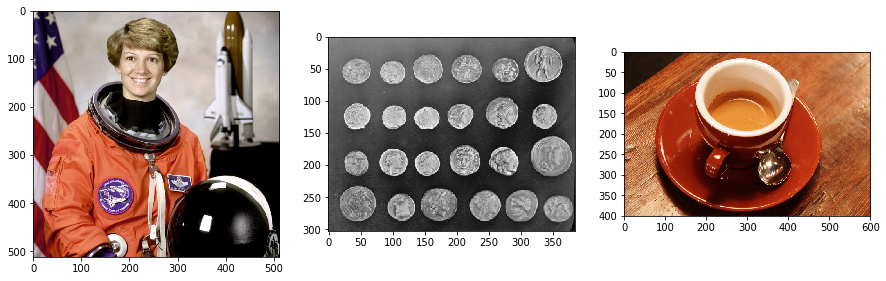

In [3]:
ex1= data.astronaut()
ex2 = data.coins()
ex3 = data.coffee()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 10))

ax1.imshow(ex1)
ax2.imshow(ex2, cmap= 'gray')
ax3.imshow(ex3, cmap = 'gray')

### 4.1 Haar cascades

![](https://journals.plos.org/plosone/article/figure/image?id=10.1371/journal.pone.0173424.g002&size=large)

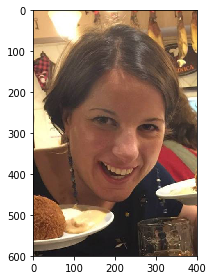

In [4]:
img = io.imread('Images/me.jpg')
crop = img[0:600,200:600]
io.imshow(crop)

In [5]:
import cv2

In [6]:
haar_path = '/usr/local/lib/python3.6/dist-packages/cv2/data/haarcascade_frontalface_alt.xml'
faceCascade = cv2.CascadeClassifier(haar_path)

faceCascade.empty()

False

In [7]:
gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)


faces = faceCascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=4, minSize=(50, 50),flags=cv2.CASCADE_SCALE_IMAGE)

faces

array([[ 86, 187, 276, 276]], dtype=int32)

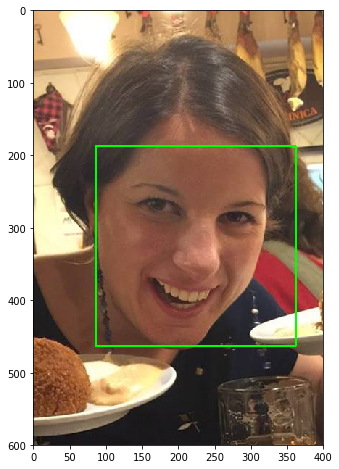

In [8]:
for (x, y, w, h) in faces:
    cv2.rectangle(crop, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
plt.figure(figsize=(8,8))
plt.imshow(crop)

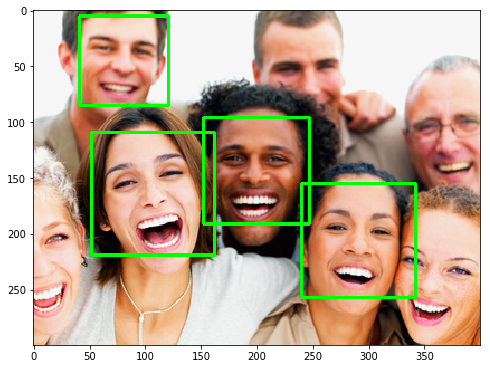

In [9]:
img = io.imread('Images/people.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = faceCascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=4, minSize=(50, 50),flags=cv2.CASCADE_SCALE_IMAGE)

for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
plt.figure(figsize=(8,8))
plt.imshow(img)

### 4.2 HOG : Histogram of oriented Gradients 

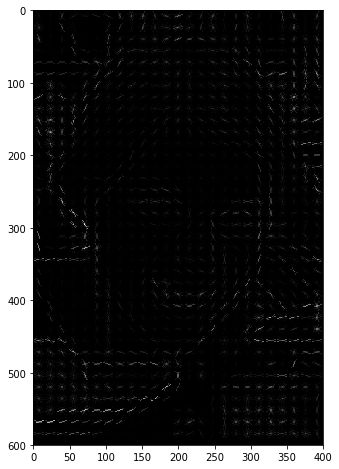

In [14]:
img = io.imread('Images/me.jpg')
crop = img[0:600,200:600]

fd, hog_image = hog(crop, orientations=8, pixels_per_cell=(16, 16),cells_per_block=(1, 1), visualize=True, multichannel=True, block_norm='L2-Hys')

plt.figure(figsize=(8,8))
plt.imshow(hog_image, cmap = 'gray')

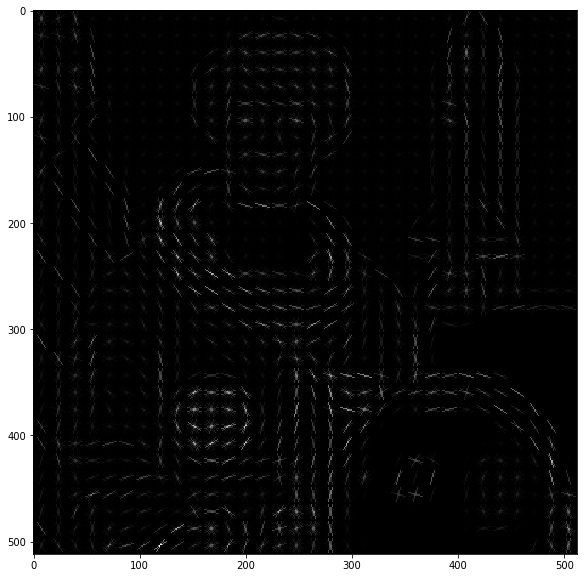

In [15]:
fd, hog_image2 = hog(ex1, orientations=8, pixels_per_cell=(16, 16),cells_per_block=(1, 1), visualize=True, multichannel=True, block_norm='L2-Hys')

plt.figure(figsize=(10,10))
plt.imshow(hog_image2, cmap = 'gray')

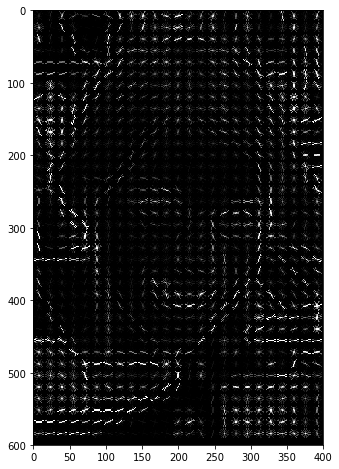

In [16]:
hog_image_r = exposure.rescale_intensity(hog_image, in_range=(0, 12))

plt.figure(figsize=(8,8))
plt.imshow(hog_image_r, cmap = 'gray')

In [17]:
import dlib, cv2

detector = dlib.get_frontal_face_detector()
gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
faces = detector(gray, 1)

faces

rectangles[[(82, 171) (349, 439)]]

In [18]:
faces[0].area()

72092L

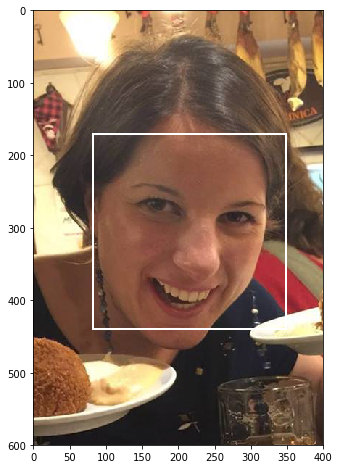

In [19]:
for face in faces:
    pt1,pt2 = face.tl_corner(), face.br_corner() 
    cv2.rectangle(crop, (pt1.x,pt1.y), (pt2.x,pt2.y), (255,255,255), 2)
plt.figure(figsize=(8,8))
plt.imshow(crop)

In [20]:
img = io.imread('Images/people.jpg')

detector = dlib.get_frontal_face_detector()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = detector(gray, 1)

faces

rectangles[[(245, 166) (335, 255)], [(155, 106) (245, 196)], [(66, 126) (155, 216)], [(36, 7) (126, 96)], [(315, 206) (404, 295)], [(328, 80) (403, 155)]]

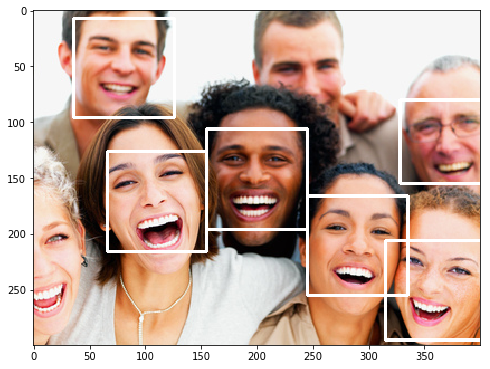

In [22]:
for face in faces:
    pt1,pt2 = face.tl_corner(), face.br_corner() 
    cv2.rectangle(img, (pt1.x,pt1.y), (pt2.x,pt2.y), (255,255,255), 2)

plt.figure(figsize=(8,8))
plt.imshow(img)

### Face Landmarks detection

In [81]:
import dlib, cv2
import numpy as np

img = io.imread('Images/me.jpg')

detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')

face_mark = detector(img, 1)

face_mark

rectangles[[(290, 201) (557, 468)]]

In [82]:
shape = predictor(img, face_mark[0])
shape.parts()

points[(287, 245), (285, 281), (286, 317), (290, 352), (303, 384), (323, 413), (344, 438), (369, 459), (397, 466), (422, 460), (442, 439), (461, 418), (481, 395), (498, 372), (510, 346), (517, 318), (522, 290), (331, 242), (353, 237), (376, 241), (398, 250), (417, 263), (465, 270), (481, 265), (496, 262), (510, 264), (519, 272), (440, 286), (438, 307), (437, 329), (435, 352), (398, 354), (411, 361), (426, 368), (439, 365), (450, 360), (352, 265), (369, 262), (385, 265), (398, 278), (382, 276), (366, 273), (459, 288), (473, 279), (488, 280), (499, 288), (487, 292), (473, 290), (351, 367), (378, 372), (403, 376), (417, 381), (430, 380), (445, 380), (458, 382), (441, 408), (423, 421), (409, 421), (394, 417), (370, 400), (357, 371), (401, 382), (415, 386), (428, 386), (452, 384), (426, 405), (412, 407), (398, 403)]

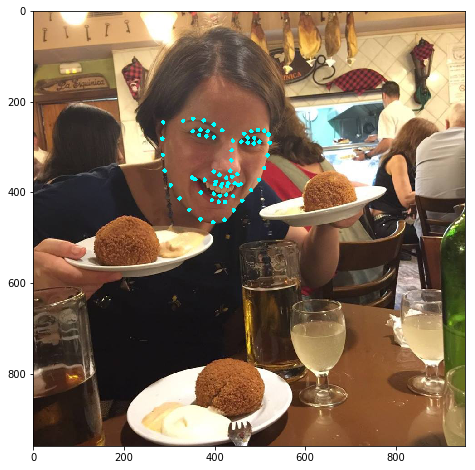

In [83]:
for point in shape.parts():
    cv2.circle(img, (point.x,point.y), 2, color=(0, 255, 255), thickness=5)
    
plt.figure(figsize=(8,8))
plt.imshow(img)